# **Project 3**, APS1070 Winter 2023
#### **PCA [10 marks]**
**Deadline: Mar 13th, 23:00**

**Academic Integrity**

This project is individual - it is to be completed on your own. If you have questions, please post your query in the APS1070 Piazza Q&A forums (the answer might be useful to others!).

Do not share your code with others, or post your work online. Do not submit code that you have not written yourself. Students suspected of plagiarism on a project, midterm or exam will be referred to the department for formal discipline for breaches of the Student Code of Conduct.

In this project we work on a COVID-19 vaccination dataset for different countries at the end of each day.

Please fill out the following:


*   **Name: Abhishek Patel**
*   **Student number: 1009311031**



### How to submit **(HTML + IPYNB)**

1. Download your notebook: `File -> Download .ipynb`

2. Click on the Files icon on the far left menu of Colab

3. Select & upload your `.ipynb` file you just downloaded, and then obtain its path (right click) (you might need to hit the Refresh button before your file shows up)


4. execute the following in a Colab cell:
```
%%shell
jupyter nbconvert --to html /PATH/TO/YOUR/NOTEBOOKFILE.ipynb
```

5. An HTML version of your notebook will appear in the files, so you can download it.

6. Submit **both** <font color='red'>`HTML` and `IPYNB`</font>  files on Quercus for grading.



Ref: https://stackoverflow.com/a/64487858 



# Part 1: Getting started [1 Marks]

In [231]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import math
from sklearn.preprocessing import StandardScaler
from IPython import display as show


sns.set_theme(context='notebook', style='darkgrid', palette='brg', font='sans-serif', font_scale=1.5, color_codes=True)

cases_raw = pd.read_csv(filepath_or_buffer = 'https://raw.githubusercontent.com/APS1070-W23/datasets/main/country_vaccinations_wide.csv', 
                        index_col=0)

# cases_raw

1. Write a function to do the following: **[0.25]**
    * Takes the dataframe, and your country list as inputs (United States, China, Canada, ...)
    * Plots time-series for the input list (it is best to plot each country in a separate graph (subplot), so you can easily compare them.)
    
2. Apply `StandardScalar` to the data. Each day should have a `mean` of zero and a `StD` of 1. **[0.25]**
3. Run the function in `step 1` on the standardized dataset for the `United States`, `China`, and `Canada`.   **[0.25]**
4. Discuss the trends in the standardized time-series for the `United States`, `Canada`, and `China`. What does it mean if the curve goes up or down (are the number of vaccinations negative?) What does the sign of values indicate? **[0.25]**

In [97]:
# Step 2: Standardizing the data

scaler = StandardScaler()

cases_std = scaler.fit_transform(cases_raw)
cases_std = pd.DataFrame(cases_std, columns = cases_raw.columns, index = cases_raw.index)
# cases_std

print('Raw cases: Mean - 10th Column : {0:.4f}'.format(cases_raw.iloc[:,10].mean()))
print('Raw cases: StD - 10th Column : {0:.4f}'.format(cases_raw.iloc[:,10].std()))
print('Standardized cases: Mean - 10th Column : {0:.4f}'.format(cases_std.iloc[:,10].mean()))
print('Standardized cases: StD - 10th Column : {0:.4f}'.format(cases_std.iloc[:,10].std()))

Raw cases: Mean - 10th Column : 0.0090
Raw cases: StD - 10th Column : 0.1339
Standardized cases: Mean - 10th Column : -0.0000
Standardized cases: StD - 10th Column : 1.0022


Country Time Series


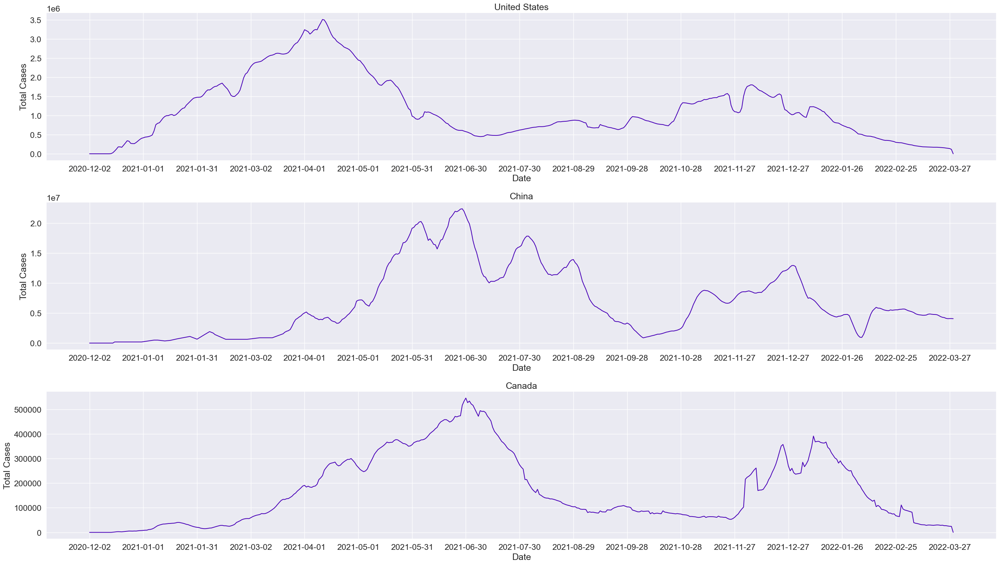

Standardized Country Time Series


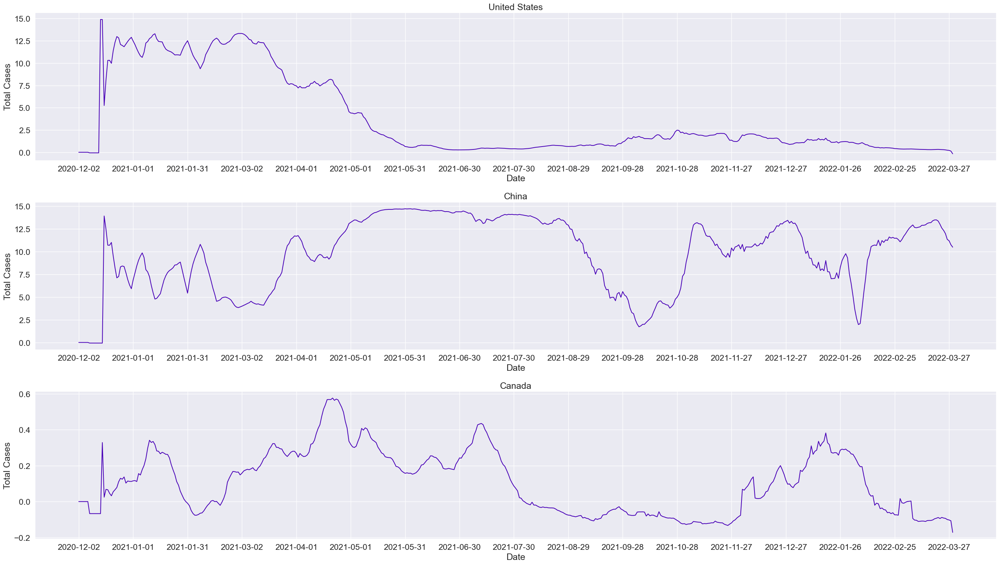

In [86]:
# Step 1 & 3: Common Function Defined

def country_time_series(df, df_std, country_list, std = False):
    if std:
        fig, axs = plt.subplots(len(country_list), 1, figsize=(28, 16), dpi = 100)
        for i, country in enumerate(country_list):
            df_country = df_std[df_std.index==country].iloc[:,:].sum()
            axs[i].plot(df_country.index, df_country.values)
            axs[i].set_title(country)
            axs[i].set_xlabel('Date')
            axs[i].set_ylabel('Total Cases')
#             axs[i].set_xticks(np.arange(1, 483, 20))
            axs[i].xaxis.set_major_locator(plt.MaxNLocator(20))
        plt.tight_layout()
        print('Standardized Country Time Series')
        plt.show()
    else:
        fig, axs = plt.subplots(len(country_list), 1, figsize=(28, 16), dpi = 100)
        for i, country in enumerate(country_list):
            df_country = df[df.index==country].iloc[:,:].sum()
            axs[i].plot(df_country.index, df_country.values)
            axs[i].set_title(country)
            axs[i].set_xlabel('Date')
            axs[i].set_ylabel('Total Cases')
#             axs[i].set_xticks(np.arange(1, 483, 20))
            axs[i].xaxis.set_major_locator(plt.MaxNLocator(20))
        plt.tight_layout()
        print('Country Time Series')
        plt.show()

country_time_series(cases_raw, cases_std, ['United States', 'China', 'Canada'], std = False)
country_time_series(cases_raw, cases_std, ['United States', 'China', 'Canada'], std = True)

**Discuss the trends in the standardized time-series for the United States, Canada, and China. What does it mean if the curve goes up or down (are the number of vaccinations negative?) What does the sign of values indicate? [0.25]**

For the raw cases:
* Initially the cases for all 3 countries increased untill and peaked in **mid-April**, and **mid-June** for **US** and **China** & **Canada**, respectively.
* After which they decreased for the next month respectively as the number of vacinations may have increased, but the cases in China lasted a bit longer than the other 2 because it had another surge in July.
* All 3 countries had a smaller scale surge before the year 2021 ended and it started to decrease as 2022 began. These were sudden surges in China and Canada but as it is seen from US timeplot, it was a more gradual increase rather than a sudden increase.

For the standardized cases:
* US has a high number of cases at the beginning and it stays that way unitll **mid-March**, after which it decreases and remains like that through out till the end.
* China has a lot of ups and downs but these are mostly ups, as it started off with a high number of cases, then decreased and increased again at the beginning of **03-2021**, then remained there for the following 3 months, decreased in **September** and a sudden surge in **October** after which it never came down.
* Canada had a similar tragectory to China but it only had an increase in **March 2021**, then it started to decrease in general and remained like that untill **November**, then a short increase by the beginning of **2022** but it started to decrese again.

The ups and downs indicated the rate of increase in the cases per day since it is standardized number of cases per day, thus if the rate of increase in cases is greater than the average rate of increase in cases, then the graph will go up and vice versa for down.

The **positives** and **negatives** are explained as follows:
* **0** = Average number of cumalative cases of all countries.
* **-ve** = Cumalative cases of that country on that day < 0
* **+ve** = Cumalative cases of that country on that day > 0

# Part 2: Applying PCA [2 Marks]

1. Compute the covariance matrix of the dataframe. *Hint: The dimensions of your covariance matrix should be (511, 511).* **[0.25]**
2. Write a function `get_sorted_eigen(df_cov)` that gets the covariance matrix of dataframe `df` (from step 1), and returns sorted eigenvalues and eigenvectors using `np.linalg.eigh`. **[0.25]**
3. Show the effectiveness of your principal components in covering the variance of the dataset by superimposing the cumulative explained variance to a scree plot. **[0.25]**
4. How many PCs do you need to cover 99% of the dataset's variance? Write an expression for this. **[0.25]** **[0.25]**
5. Plot the first 16 principal components (Eigenvectors) as a time series (16 subplots, on the x-axis you have dates and on the y-axis you have the value of the PC element) . **[0.5]**
6. Compare the first two PCs with the rest of them. Do you see any difference in their trend? **[0.5]**

The Shape of Covaraince Matirx: (483, 483)


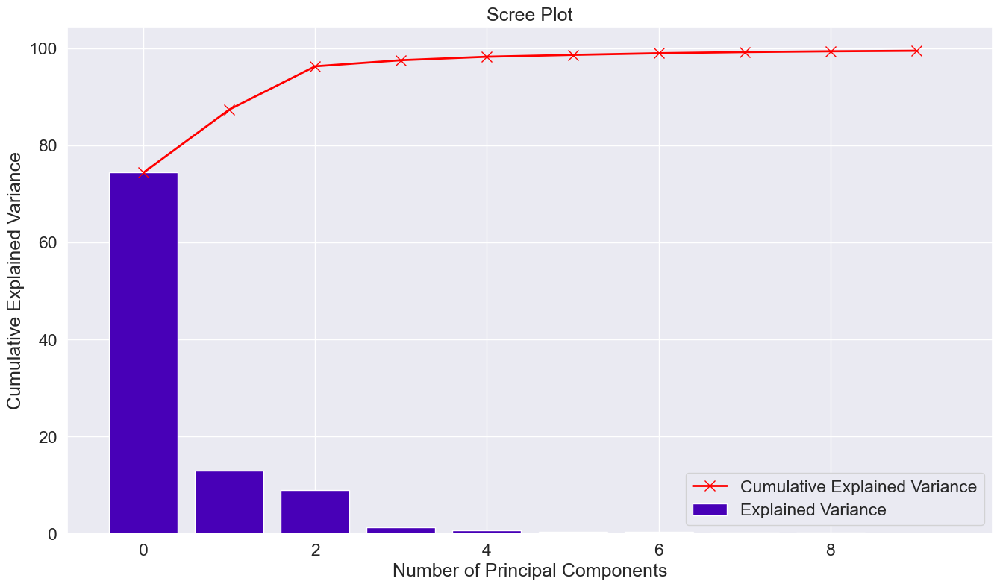

Number of PCs needed to cover 99% Variance: 8


In [214]:
# Step 1: Covariance Matrix

cases_std_cov = cases_std.cov()
print('The Shape of Covaraince Matirx:', cases_std_cov.shape)

# Step 2: Function defined

def get_sorted_eigen(df_cov):
    # Compute eigenvalues and eigenvectors using np.linalg.eigh
    eigenvalues, eigenvectors = np.linalg.eigh(df_cov)
    
    # Sort the eigenvalues in descending order
    idx = eigenvalues.argsort()[::-1]
    eigenvalues = eigenvalues[idx]
    eigenvectors = eigenvectors[:,idx]
    
    # Return sorted eigenvalues and eigenvectors
    return eigenvalues, eigenvectors

eigenvalues, eigenvectors = get_sorted_eigen(cases_std_cov)

# Step 3: Scree Plot

# Total Variance of the dataset
total_var = np.sum(eigenvalues)

# Explained variance for each principal component (PC)
explained_var = (eigenvalues / total_var) * 100
explained_var10 = explained_var[:10]

# Cumulative explained variance
cumulative_var = np.cumsum(explained_var)
cumulative_var10 = cumulative_var[:10]

# Scree plot with cumulative explained variance
plt.figure(figsize = (16, 9), dpi = 100)
plt.bar(range(10), explained_var10, label='Explained Variance')
plt.plot(cumulative_var10, 'r-x', markersize = 10, linewidth = 2, label='Cumulative Explained Variance')
plt.title('Scree Plot')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.legend()
plt.show()

# Step 4: Number of PCs for 99% Variance

n_components = np.argmin(cumulative_var <= 99) + 1
print('Number of PCs needed to cover 99% Variance:', n_components)

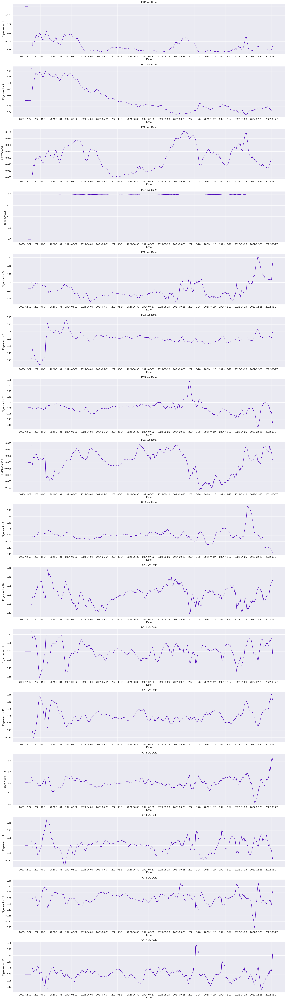

In [218]:
# Step 5: 16 PCs

# Plotting the PCs
fig, axs = plt.subplots(16, figsize=(28, 100), dpi = 100)
for i in range(16):
    axs[i].set_title('PC' + str(i+1) + ' v/s Date')
    axs[i].plot(cases_raw.columns, eigenvectors[:,i])
    axs[i].xaxis.set_major_locator(plt.MaxNLocator(20))
    axs[i].set_xlabel('Date')
    axs[i].set_ylabel('Eigenvector ' + str(i+1))
plt.tight_layout(rect=[0.01, 0.01, 1, 0.97])
plt.show()

**Compare the first two PCs with the rest of them. Do you see any difference in their trend? [0.5]**

The first 2 PCs have a general decreasing trend compared to the rest, which have an upward going curve and more fluctuations in general. They are also relatively smoother than the othes as these may be the ones capturing the general trend of the entire dataset.

# Part 3: Data reconstruction [3 Marks]

Create a function that:

*   Accepts a country and the original dataset as inputs.
*   Calls useful functions that you designed in previous parts to compute eigenvectors and eigenvalues. 
*   Plots 4 figures:
  1.   The original time-series for the specified country. **[0.5]**
  2.   The incremental reconstruction of the **original** (not standardized) time-series for the specified country in a single plot. **[1.5]**
       * You should at least show 5 curves in a figure for incremental reconstruction. For example, you can pick the following (or any other combination that you think is reasonable): 
          * Reconstruction with only PC1
          * Reconstruction with both PC1 and PC2
          * Reconstruction with PC1 to PC4 (First 4 PCs)
          * Reconstruction with PC1 to PC8 (First 8 PCs)
          * Reconstruction with PC1 to PC16 (First 16 PCs)

      * Hint: you need to compute the reconstruction for the standardized time-series first, and then scale it back to the original (non-standardized form) using the StandardScaler `inverse_transform` [help...](https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html#sklearn.preprocessing.StandardScaler.inverse_transform)
  3.   The residual error for your best reconstruction with respect to the original time-series. **[0.5]**
      * Hint: You are plotting the error that we have for reconstructing each day `(df - df_reconstructed)`. On the x-axis, you have dates, and on the y-axis, the residual error. 
  4.   The RMSE of the reconstruction as a function of the number of included components (x-axis is the number of components and y-axis is the RMSE). Sweep x-axis from 1 to 10 (this part is independent from part 3.2.) **[1]**

Test your function using the `United States`, `Canada`, and `China` as inputs. **[0.5]**


In [441]:
def plot_country_figures(original_df, country_name):
        
    scaler = StandardScaler()
    df_std = scaler.fit_transform(original_df)
    df_std = pd.DataFrame(df_std, columns = original_df.columns, index = original_df.index)

    df_cov = df_std.cov()

    eigenvalues, eigenvectors = get_sorted_eigen(df_cov)

    fig, axs =  plt.subplots(4, 1, figsize = (28,26), dpi = 100)
    fig.tight_layout(pad = 3.0)
    
#     Original Data Plot
    df_country = original_df[original_df.index == country_name].iloc[:,:].sum()
    axs[0].plot(df_country.index, df_country.values)
    axs[0].set_title(country_name)
    axs[0].set_xlabel('Date')
    axs[0].set_ylabel('Total Cases')
    axs[0].xaxis.set_major_locator(plt.MaxNLocator(20))
    
#     Recontructed Data
    PCs = [1, 2, 4, 8, 16, 32, 64]
    
    for pc in PCs:
        W = eigenvectors[:, :pc]
        projected = np.dot(df_std, W)
        reconstructed_std = np.dot(projected, W.T)
        reconstructed_original = scaler.inverse_transform(reconstructed_std)
        reconstructed_raw = pd.DataFrame(reconstructed_original, columns = original_df.columns, index = original_df.index)
        axs[1].plot(df_country.index, df_country.values)
        axs[1].plot(original_df.columns, reconstructed_raw.loc[country_name].values, label = 'PC' + str(pc))
        axs[1].legend()
        axs[1].set_title('Incremental Reconstruction for ' + country_name)
        axs[1].set_xlabel('Date')
        axs[1].set_ylabel('Reconstructed Number of Cases')
        axs[1].xaxis.set_major_locator(plt.MaxNLocator(20))

#     Residual Error
    residual_error = original_df.loc[country_name] - reconstructed_raw.loc[country_name]
    axs[2].plot(original_df.columns, residual_error)
    axs[2].set_title('Residual Error of Best Reconstruction for ' + country_name)
    axs[2].set_xlabel('Date')
    axs[2].set_ylabel('Residual Error')
    axs[2].xaxis.set_major_locator(plt.MaxNLocator(20))

#     RMSE
    RMSE = []
    for i in range(10):
        W = eigenvectors[:, :i]
        projected = np.dot(df_std, W)
        reconstructed_std = np.dot(projected, W.T)
        reconstructed_original = scaler.inverse_transform(reconstructed_std)
        reconstructed_raw = pd.DataFrame(reconstructed_original, columns = original_df.columns, index = original_df.index)
        n = reconstructed_raw.loc[country_name].size
        SE = sum(np.square(original_df.loc[country_name] - reconstructed_raw.loc[country_name]))/n
        RMSE.append(math.sqrt(SE))
    axs[3].plot(range(1,11), RMSE)
    axs[3].set_title('RMSE with Number of Components for ' + country_name)
    axs[3].set_xlabel('Number of Components')
    axs[3].set_ylabel('RMSE')
    
    return(RMSE)

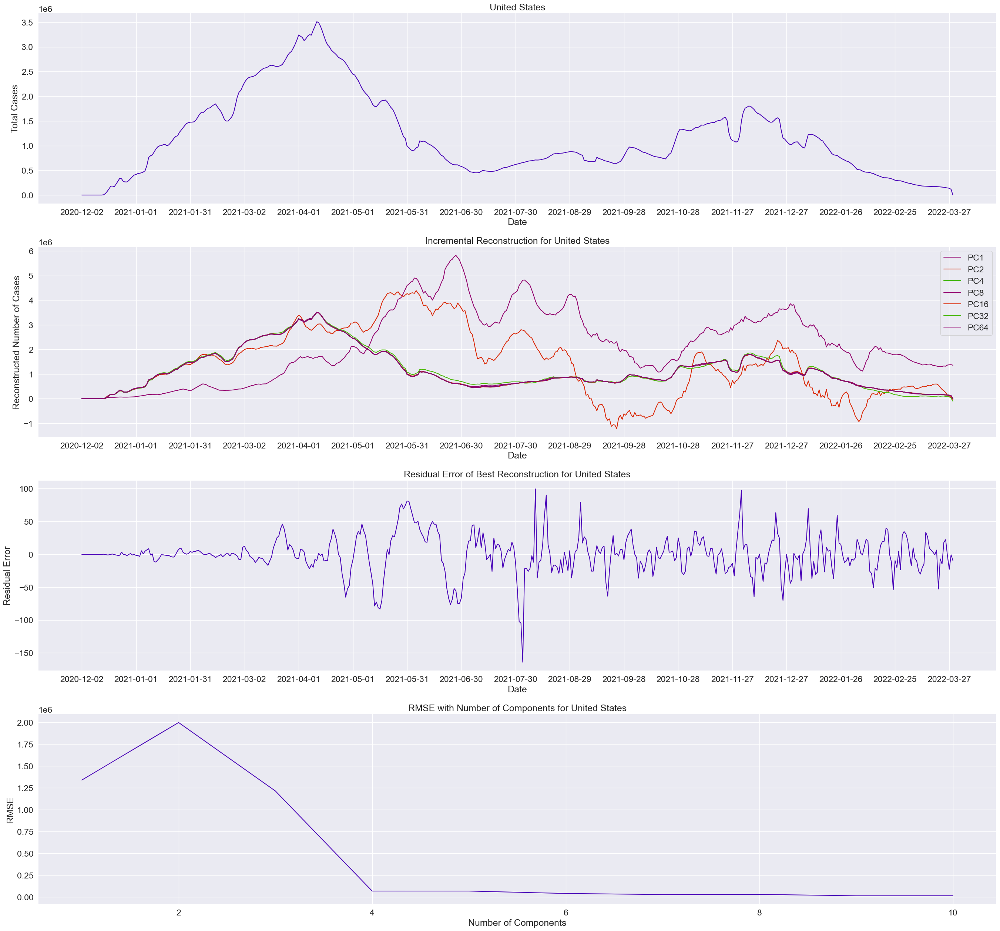

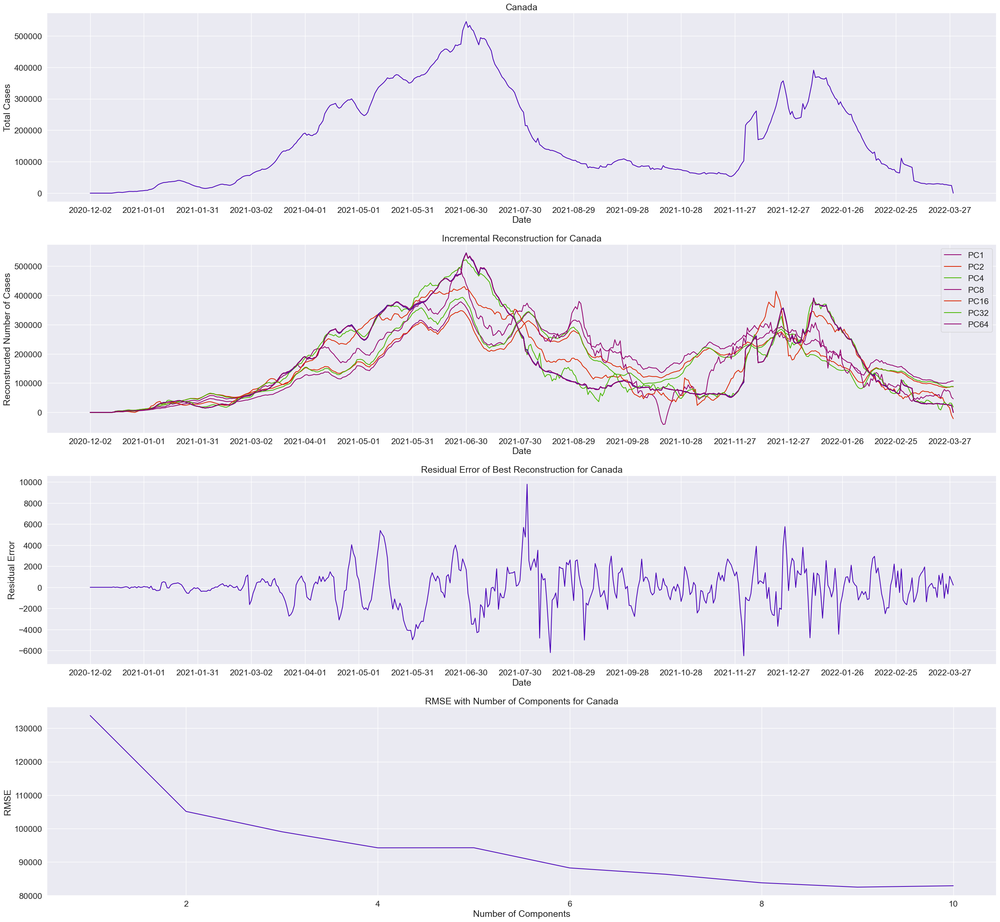

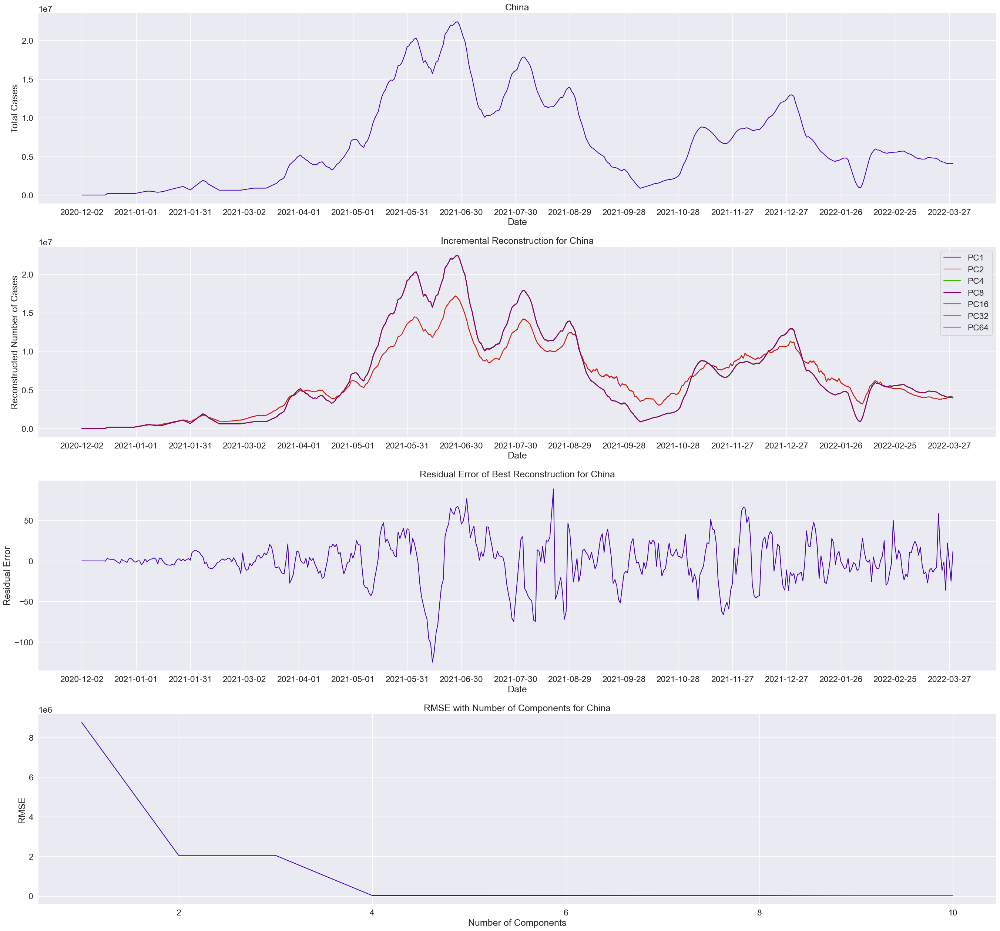

In [442]:
# Empty 3x10 numpy array 
RMSE_PCA = np.zeros((3,10))
RMSE_PCA[0] = plot_country_figures(cases_raw, 'United States')
RMSE_PCA[1] = plot_country_figures(cases_raw, 'Canada')
RMSE_PCA[2] = plot_country_figures(cases_raw, 'China')

# Part 4: SVD [2 Marks]
Modify your code in part 3 to use SVD instead of PCA for extracting the eigenvectors. **[1]**

Explain if standardization or covariance computation is required for this part.
Repeat part 3 and compare your PCA and SVD results. Write a function to make this comparison **[0.5]**, and comment on the results. **[0.5]**.

In [443]:
def plot_country_figures_SVD(original_df, country_name):
    
    U, S, V = np.linalg.svd(original_df)

    fig, axs =  plt.subplots(4, 1, figsize = (28,26), dpi = 100)
    fig.tight_layout(pad = 3.0)
    
#     Original Data Plot
    df_country = original_df[original_df.index == country_name].iloc[:,:].sum()
    axs[0].plot(df_country.index, df_country.values)
    axs[0].set_title(country_name)
    axs[0].set_xlabel('Date')
    axs[0].set_ylabel('Total Cases')
    axs[0].xaxis.set_major_locator(plt.MaxNLocator(20))
    
#     Recontructed Data
    SVs = [1, 2, 4, 8, 16, 32, 64]
    
    for sv in SVs:
        u = U[:,:sv]
        v = V[:sv,:]
        reconstructed_original = (u * S[:sv]) @ v
        reconstructed_raw = pd.DataFrame(reconstructed_original, columns = original_df.columns, index = original_df.index)
        
        axs[1].plot(df_country.index, df_country.values)
        axs[1].plot(original_df.columns, reconstructed_raw.loc[country_name].values, label = 'SV' + str(sv))
        axs[1].legend()
        axs[1].set_title('Incremental Reconstruction for ' + country_name)
        axs[1].set_xlabel('Date')
        axs[1].set_ylabel('Reconstructed Number of Cases')
        axs[1].xaxis.set_major_locator(plt.MaxNLocator(20))

#     Residual Error
    residual_error = original_df.loc[country_name] - reconstructed_raw.loc[country_name]
    axs[2].plot(original_df.columns, residual_error)
    axs[2].set_title('Residual Error of Best Reconstruction for ' + country_name)
    axs[2].set_xlabel('Date')
    axs[2].set_ylabel('Residual Error')
    axs[2].xaxis.set_major_locator(plt.MaxNLocator(20))

#     RMSE
    RMSE = []
    for i in range(10):
        u = U[:,:i]
        v = V[:i,:]
        reconstructed_original = (u * S[:i]) @ v
        reconstructed_raw = pd.DataFrame(reconstructed_original, columns = original_df.columns, index = original_df.index)
        n = reconstructed_raw.loc[country_name].size
        SE = sum(np.square(original_df.loc[country_name] - reconstructed_raw.loc[country_name]))/n
        RMSE.append(math.sqrt(SE))
    axs[3].plot(range(1,11), RMSE)
    axs[3].set_title('RMSE with Number of Components for ' + country_name)
    axs[3].set_xlabel('Number of Components')
    axs[3].set_ylabel('RMSE')
    
    return (RMSE)

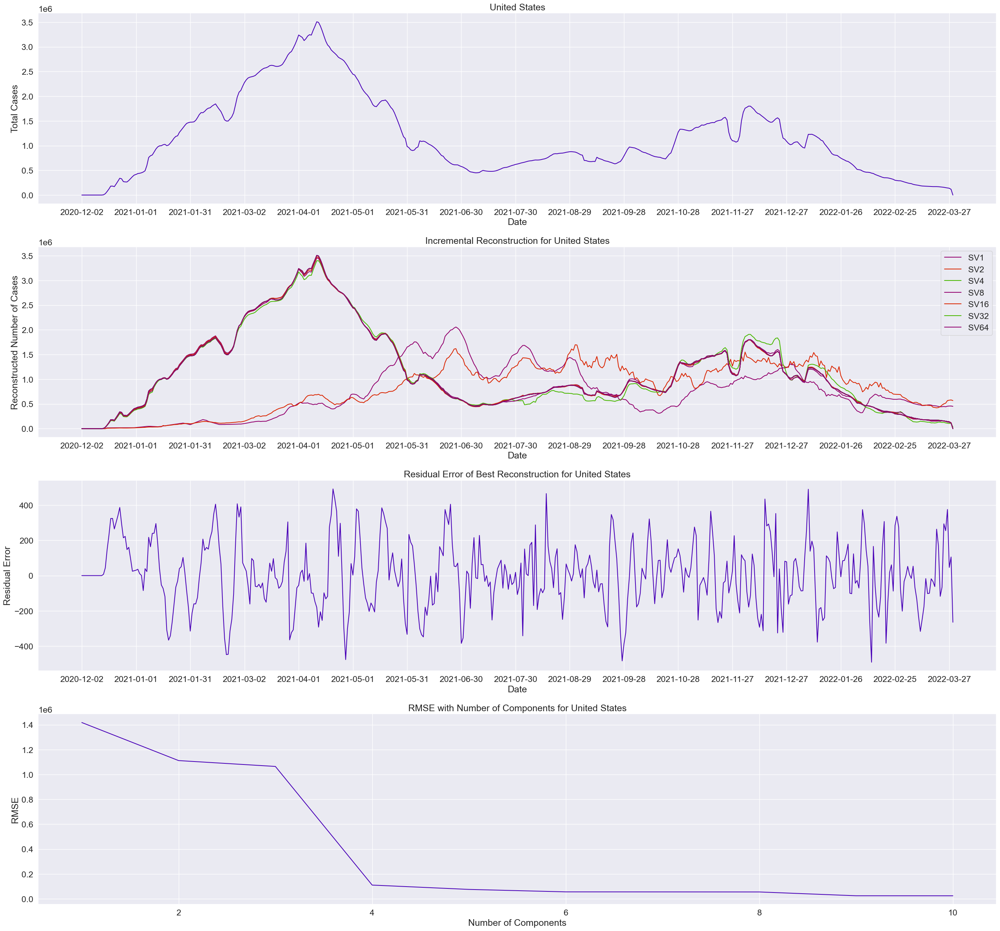

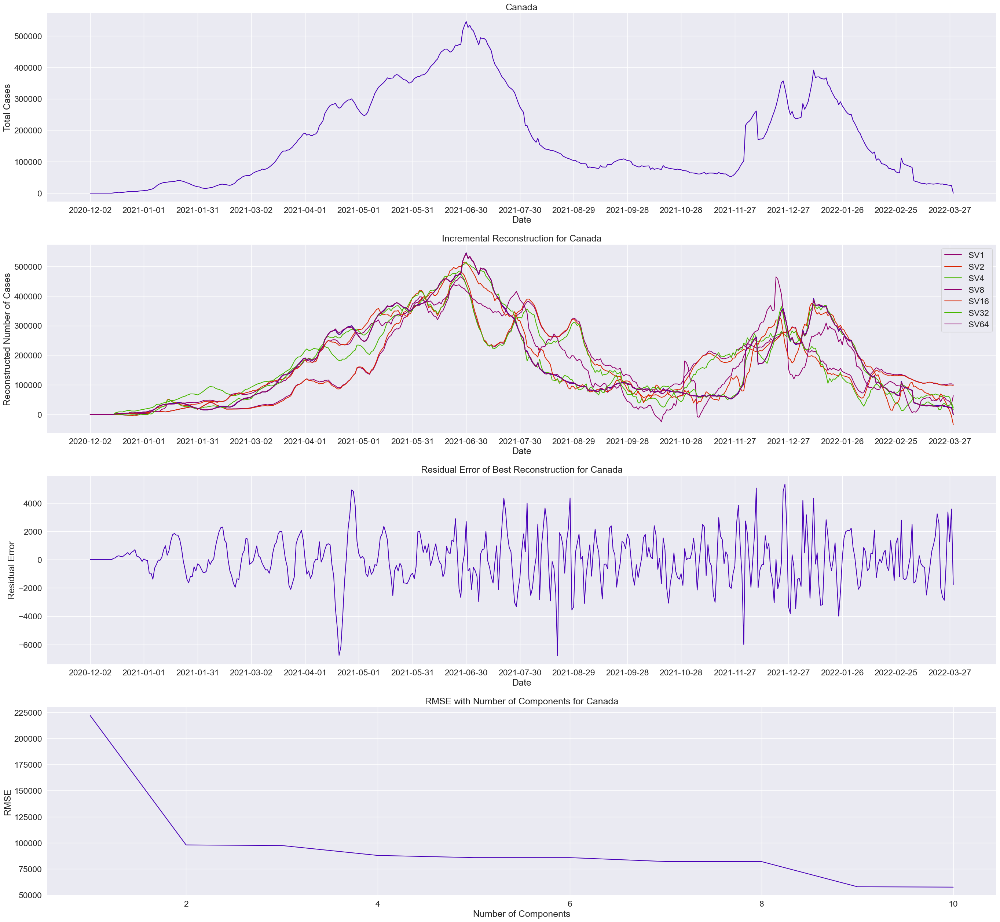

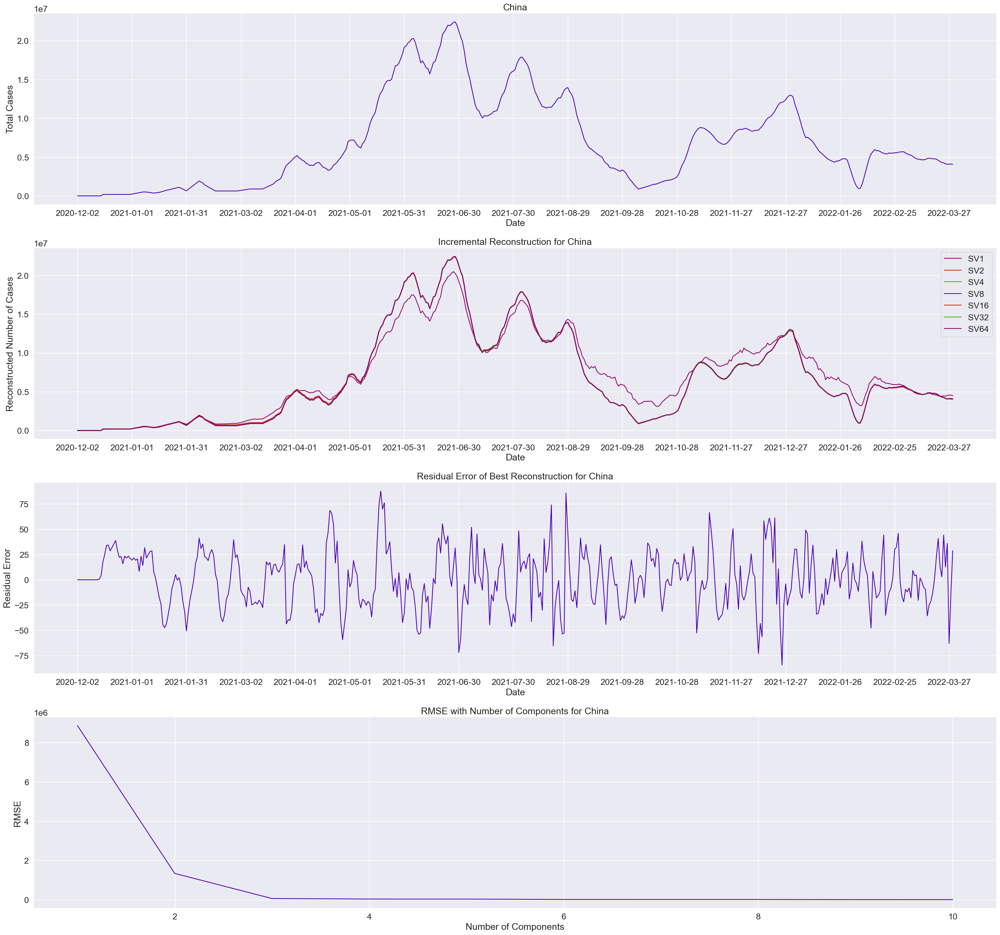

In [444]:
# Empty 3x10 numpy array 
RMSE_SVD = np.zeros((3,10))
RMSE_SVD[0] = plot_country_figures_SVD(cases_raw, 'United States')
RMSE_SVD[1] = plot_country_figures_SVD(cases_raw, 'Canada')
RMSE_SVD[2] = plot_country_figures_SVD(cases_raw, 'China')

In [445]:
def pca_vs_svd(pca, svd, country_list):
    
    for i in range(0,3):
        plt.figure(1, figsize = (28,8), dpi = 100)
        plt.plot(range(1,11), pca[i], label = 'PCA')
        plt.plot(range(1,11), svd[i], label = 'SVD')
        plt.title(f'RMSE of the PCA and SVD for {country_list[i]}')
        plt.xlabel("Components Used")
        plt.ylabel("RMSE")
        plt.legend()
        plt.show()

    diff = []
    for i in range(0,3):
        diff.append(pca[i] - svd[i])
        plt.figure(2, figsize = (28,8), dpi = 100)
        plt.plot(range(1,11), diff[i], label = country_list[i])
        plt.title(f'Difference in the RMSE for {country_list[i]}')
        plt.xlabel("Components Used")
        plt.ylabel("RMSE")
        plt.show()

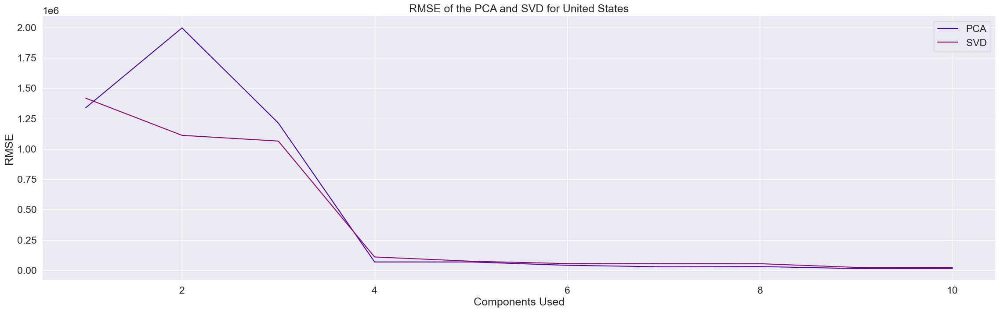

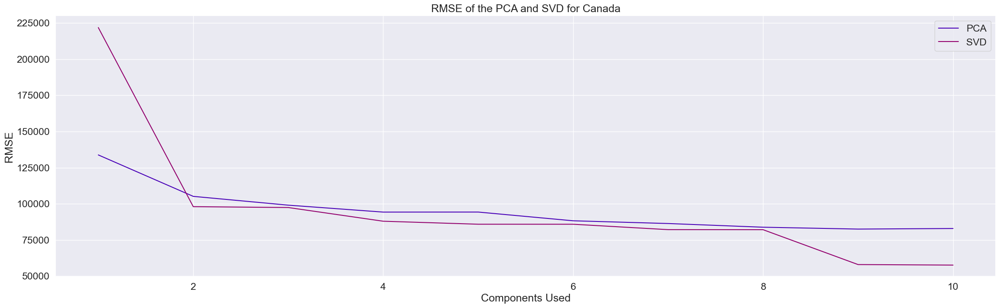

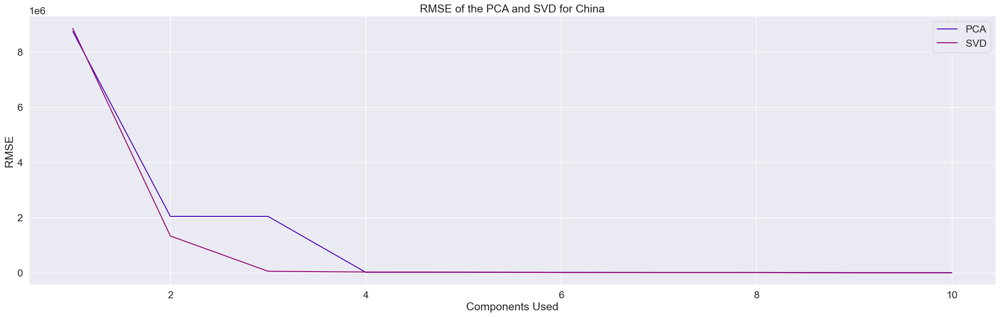

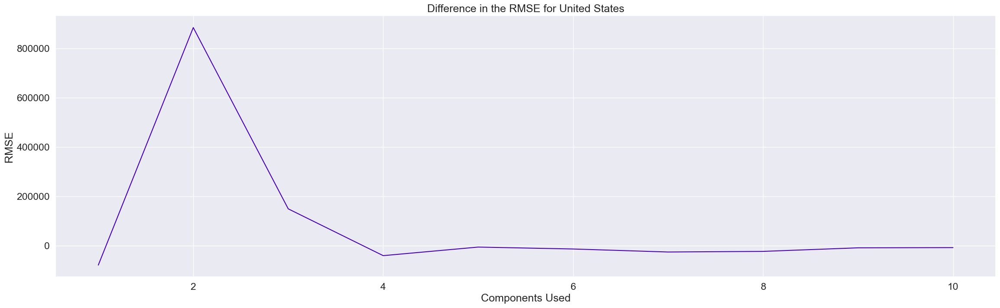

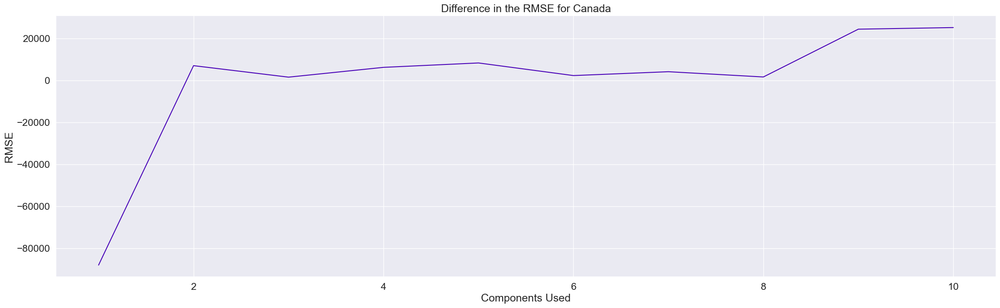

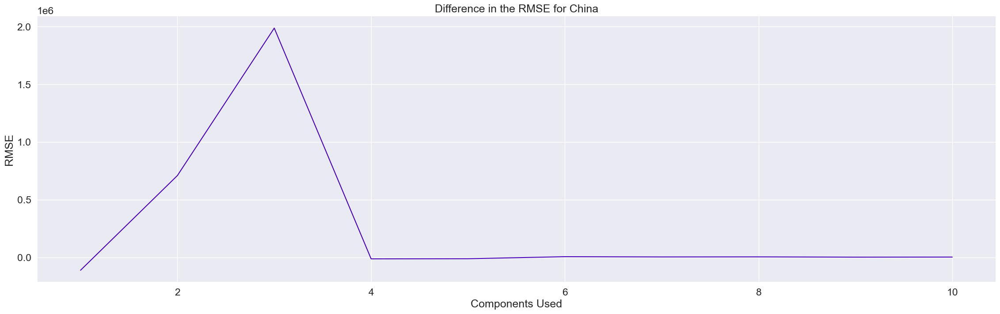

In [446]:
pca_vs_svd(RMSE_PCA, RMSE_SVD, ['United States', 'Canada', 'China'])

**Explain if standardization or covariance computation is required for this part. Repeat part 3 and compare your PCA and SVD results. Write a function to make this comparison [0.5], and comment on the results. [0.5].**

Standaridization or covariance matrix is not a requirement for SVD as SVD uses Singular Values and Singular Vectors rather than Eigen Values and Eigenvectors, which are derived from a covariance matrix. Also, the use of Singular Values and Singular Vectors makes them independant of standardization or scaling.

SVD's main feature is that the singular values and vectors capture the dominant patterns and structures in the data. This means that even if the data is not standardized or the covariance matrix is not computed, the SVD will still extract the most important information from the data.

Out of the 3 countries used to compare, it appears that SVD required less PCs to achieve the same RMSE than the PCA method. This makes it more efficient as there would be less storage required and less computational power required if the dataset is massive.

# Part 5: Let's collect another dataset! [2 Marks]
Create another dataset similar to the one provided in your handout using the raw information on COVID deaths (not vaccinations) provided [here](https://datahub.io/core/covid-19#resource-time-series-19-covid-combined). **[1]**

You need to manipulate the data to organize it in the desired format (i.e., the same format that was in previous parts). You are free to use any tools you like, from Excel to Python!
 
In the end, you should have a new CSV file with more dates (features) compared to the provided dataset. 


Upload your new dataset (in CSV format) to your colab notebook and repeat part 4. When analyzing Canada, you may use just Ontario. For China, you may use Beijing. **[1]**


Don't forget to add your new CSV file to Quercus for reference. The code below helps you to upload your new CSV file to your colab session. 

In [437]:
# load train.csv to Google Colab
# from google.colab import files
# uploaded = files.upload()

In [447]:
key_countries = pd.read_csv('key-countries-pivoted_csv.csv')
key_countries = key_countries.set_index('country').transpose()
key_countries

country,22/01/2020,23/01/2020,24/01/2020,25/01/2020,26/01/2020,27/01/2020,28/01/2020,29/01/2020,30/01/2020,31/01/2020,...,14/01/2022,15/01/2022,16/01/2022,17/01/2022,18/01/2022,19/01/2022,20/01/2022,21/01/2022,22/01/2022,23/01/2022
China,548,643,920,1406,2075,2877,5509,6087,8141,9802,...,117678,117800,118030,118204,118297,118370,118470,118544,118616,118773
US,1,1,2,2,5,5,5,6,6,8,...,65069619,65463200,65930556,66590148,67693339,68684431,69329860,70209840,70495874,70699416
United_Kingdom,0,0,0,0,0,0,0,0,0,2,...,15165209,15246179,15316611,15407216,15501850,15610069,15718193,15814617,15891905,15966838
Italy,0,0,0,0,0,0,0,0,0,2,...,8356514,8549450,8706915,8790302,9018425,9219391,9418256,9603856,9781191,9923678
France,0,0,2,3,3,3,4,5,5,5,...,13680775,14005385,14283514,14386178,14851448,15288014,15715329,16116748,16506090,16807733
Germany,0,0,0,0,0,1,4,4,4,5,...,7943959,7988210,8021339,8104157,8222262,8361262,8502132,8635461,8716804,8773030
Spain,0,0,0,0,0,0,0,0,0,0,...,8093036,8093036,8093036,8424503,8518975,8676916,8834363,8975458,8975458,8975458
Iran,0,0,0,0,0,0,0,0,0,0,...,6217320,6218741,6221033,6224196,6227849,6231909,6236567,6241843,6245346,6250490


In [468]:
def plot_country_figures(original_df, country_name):
        
    scaler = StandardScaler()
    df_std = scaler.fit_transform(original_df)
    df_std = pd.DataFrame(df_std, columns = original_df.columns, index = original_df.index)

    df_cov = df_std.cov()

    eigenvalues, eigenvectors = get_sorted_eigen(df_cov)

    fig, axs =  plt.subplots(4, 1, figsize = (28,26), dpi = 100)
    fig.tight_layout(pad = 3.0)
    
#     Original Data Plot
    df_country = original_df[original_df.index == country_name].iloc[:,:].sum()
    axs[0].plot(df_country.index, df_country.values)
    axs[0].set_title(country_name)
    axs[0].set_xlabel('Date')
    axs[0].set_ylabel('Total Cases')
    axs[0].xaxis.set_major_locator(plt.MaxNLocator(20))
    
#     Recontructed Data
    PCs = [1, 2, 4, 8]
    
    for pc in PCs:
        W = eigenvectors[:, :pc]
        projected = np.dot(df_std, W)
        reconstructed_std = np.dot(projected, W.T)
        reconstructed_original = scaler.inverse_transform(reconstructed_std)
        reconstructed_raw = pd.DataFrame(reconstructed_original, columns = original_df.columns, index = original_df.index)
        axs[1].plot(df_country.index, df_country.values)
        axs[1].plot(original_df.columns, reconstructed_raw.loc[country_name].values, label = 'PC' + str(pc))
        axs[1].legend()
        axs[1].set_title('Incremental Reconstruction for ' + country_name)
        axs[1].set_xlabel('Date')
        axs[1].set_ylabel('Reconstructed Number of Cases')
        axs[1].xaxis.set_major_locator(plt.MaxNLocator(20))

#     Residual Error
    residual_error = original_df.loc[country_name] - reconstructed_raw.loc[country_name]
    axs[2].plot(original_df.columns, residual_error)
    axs[2].set_title('Residual Error of Best Reconstruction for ' + country_name)
    axs[2].set_xlabel('Date')
    axs[2].set_ylabel('Residual Error')
    axs[2].xaxis.set_major_locator(plt.MaxNLocator(20))

#     RMSE
    RMSE = []
    for i in range(8):
        W = eigenvectors[:, :i]
        projected = np.dot(df_std, W)
        reconstructed_std = np.dot(projected, W.T)
        reconstructed_original = scaler.inverse_transform(reconstructed_std)
        reconstructed_raw = pd.DataFrame(reconstructed_original, columns = original_df.columns, index = original_df.index)
        n = reconstructed_raw.loc[country_name].size
        SE = sum(np.square(original_df.loc[country_name] - reconstructed_raw.loc[country_name]))/n
        RMSE.append(math.sqrt(SE))
    axs[3].plot(range(1,9), RMSE)
    axs[3].set_title('RMSE with Number of Components for ' + country_name)
    axs[3].set_xlabel('Number of Components')
    axs[3].set_ylabel('RMSE')
    
    return(RMSE)

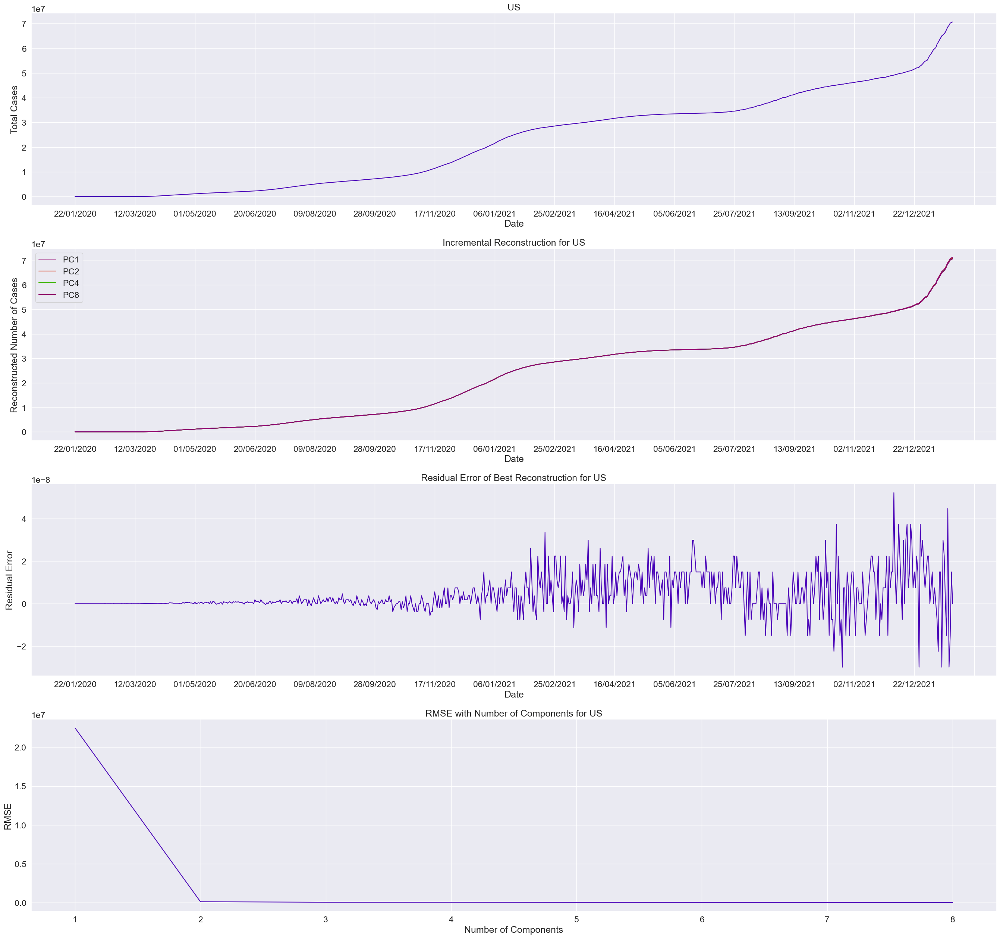

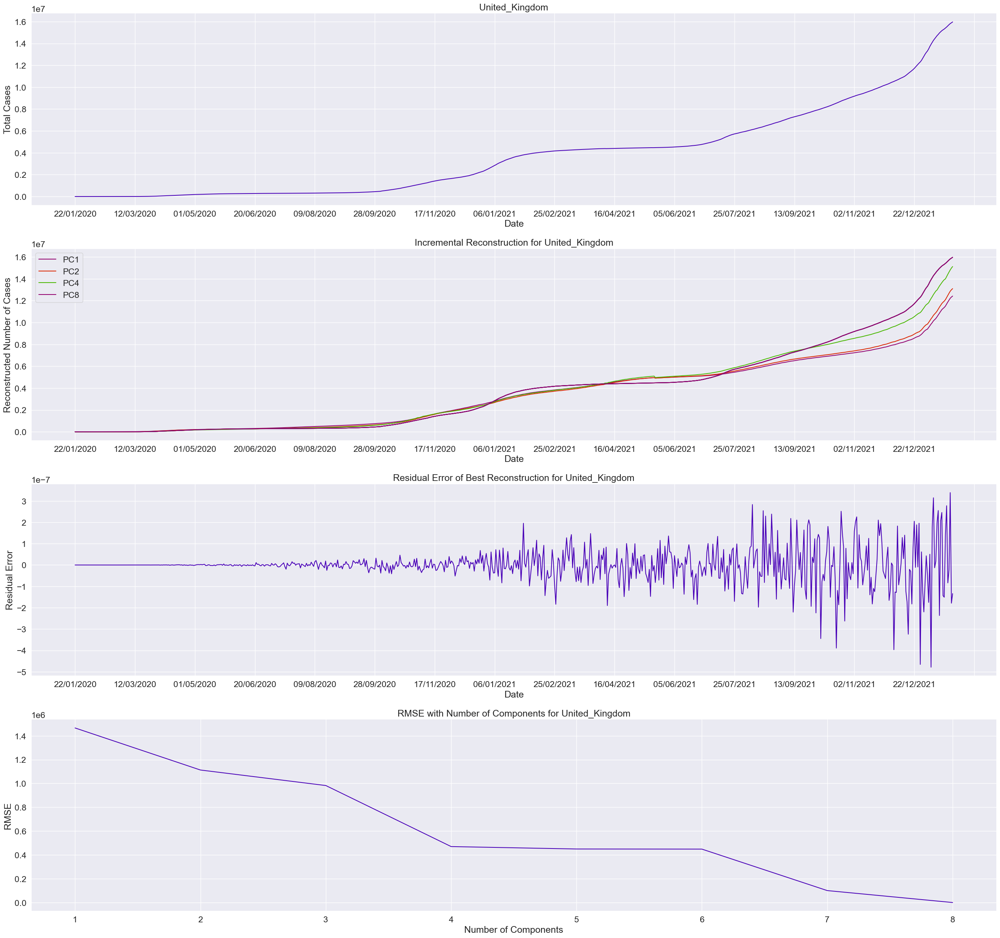

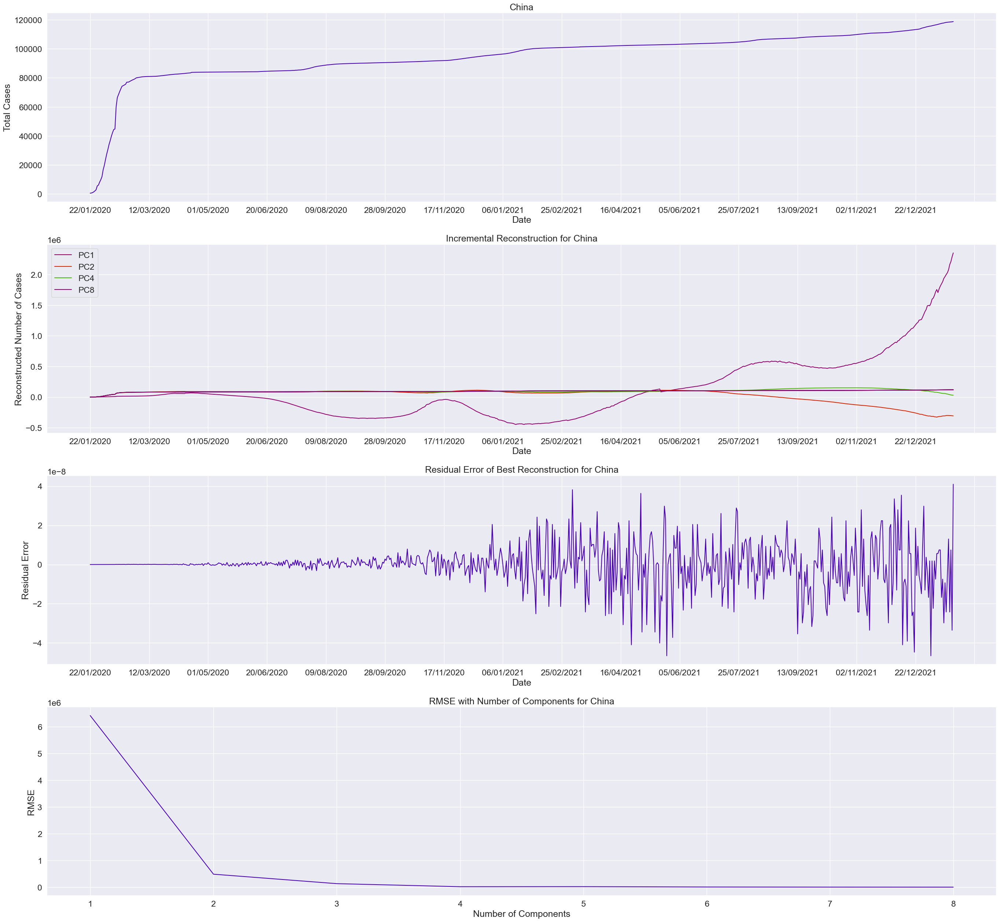

In [469]:
# Empty 3x10 numpy array 
RMSE_PCA = np.zeros((3,8))
RMSE_PCA[0] = plot_country_figures(key_countries, 'US')
RMSE_PCA[1] = plot_country_figures(key_countries, 'United_Kingdom')
RMSE_PCA[2] = plot_country_figures(key_countries, 'China')

In [465]:
def plot_country_figures_SVD(original_df, country_name):
    
    U, S, V = np.linalg.svd(original_df)

    fig, axs =  plt.subplots(4, 1, figsize = (28,26), dpi = 100)
    fig.tight_layout(pad = 3.0)
    
#     Original Data Plot
    df_country = original_df[original_df.index == country_name].iloc[:,:].sum()
    axs[0].plot(df_country.index, df_country.values)
    axs[0].set_title(country_name)
    axs[0].set_xlabel('Date')
    axs[0].set_ylabel('Total Cases')
    axs[0].xaxis.set_major_locator(plt.MaxNLocator(20))
    
#     Recontructed Data
    SVs = [1, 2, 4, 8]
    
    for sv in SVs:
        u = U[:,:sv]
        v = V[:sv,:]
        reconstructed_original = (u * S[:sv]) @ v
        reconstructed_raw = pd.DataFrame(reconstructed_original, columns = original_df.columns, index = original_df.index)
        
        axs[1].plot(df_country.index, df_country.values)
        axs[1].plot(original_df.columns, reconstructed_raw.loc[country_name].values, label = 'SV' + str(sv))
        axs[1].legend()
        axs[1].set_title('Incremental Reconstruction for ' + country_name)
        axs[1].set_xlabel('Date')
        axs[1].set_ylabel('Reconstructed Number of Cases')
        axs[1].xaxis.set_major_locator(plt.MaxNLocator(20))

#     Residual Error
    residual_error = original_df.loc[country_name] - reconstructed_raw.loc[country_name]
    axs[2].plot(original_df.columns, residual_error)
    axs[2].set_title('Residual Error of Best Reconstruction for ' + country_name)
    axs[2].set_xlabel('Date')
    axs[2].set_ylabel('Residual Error')
    axs[2].xaxis.set_major_locator(plt.MaxNLocator(20))

#     RMSE
    RMSE = []
    for i in range(8):
        u = U[:,:i]
        v = V[:i,:]
        reconstructed_original = (u * S[:i]) @ v
        reconstructed_raw = pd.DataFrame(reconstructed_original, columns = original_df.columns, index = original_df.index)
        n = reconstructed_raw.loc[country_name].size
        SE = sum(np.square(original_df.loc[country_name] - reconstructed_raw.loc[country_name]))/n
        RMSE.append(math.sqrt(SE))
    axs[3].plot(range(1,9), RMSE)
    axs[3].set_title('RMSE with Number of Components for ' + country_name)
    axs[3].set_xlabel('Number of Components')
    axs[3].set_ylabel('RMSE')
    
    return (RMSE)

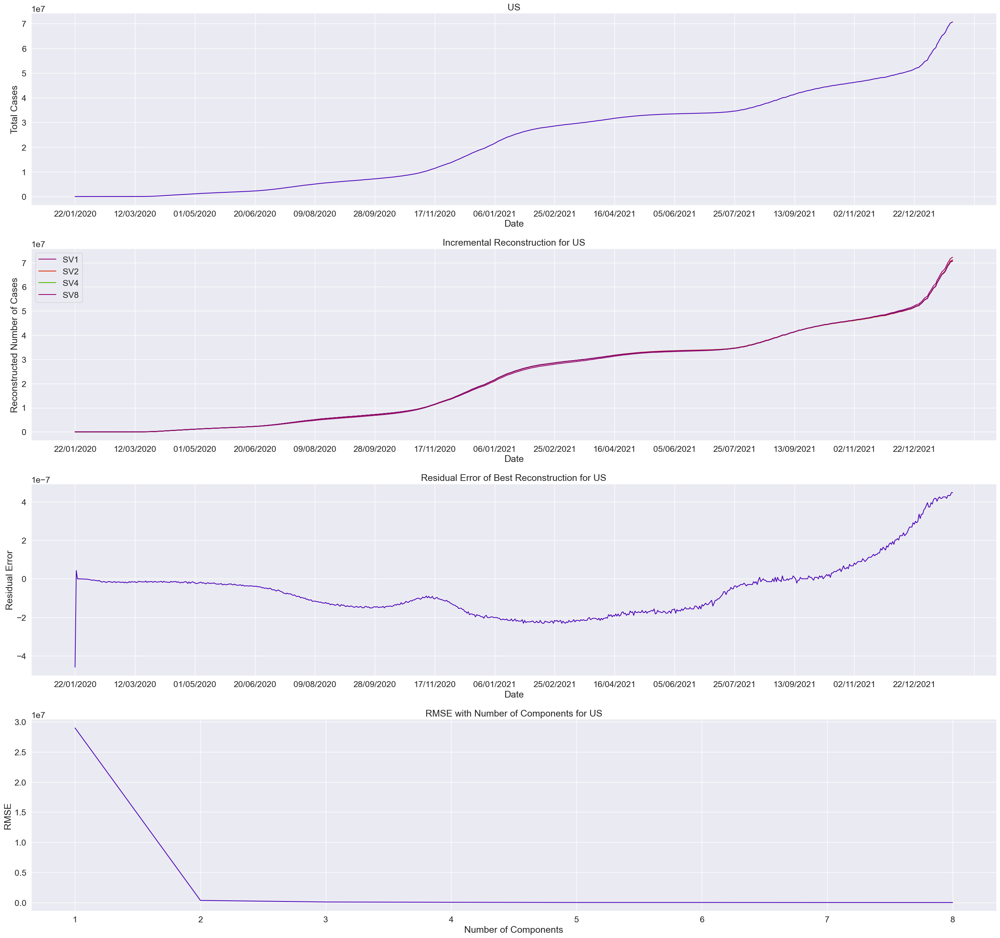

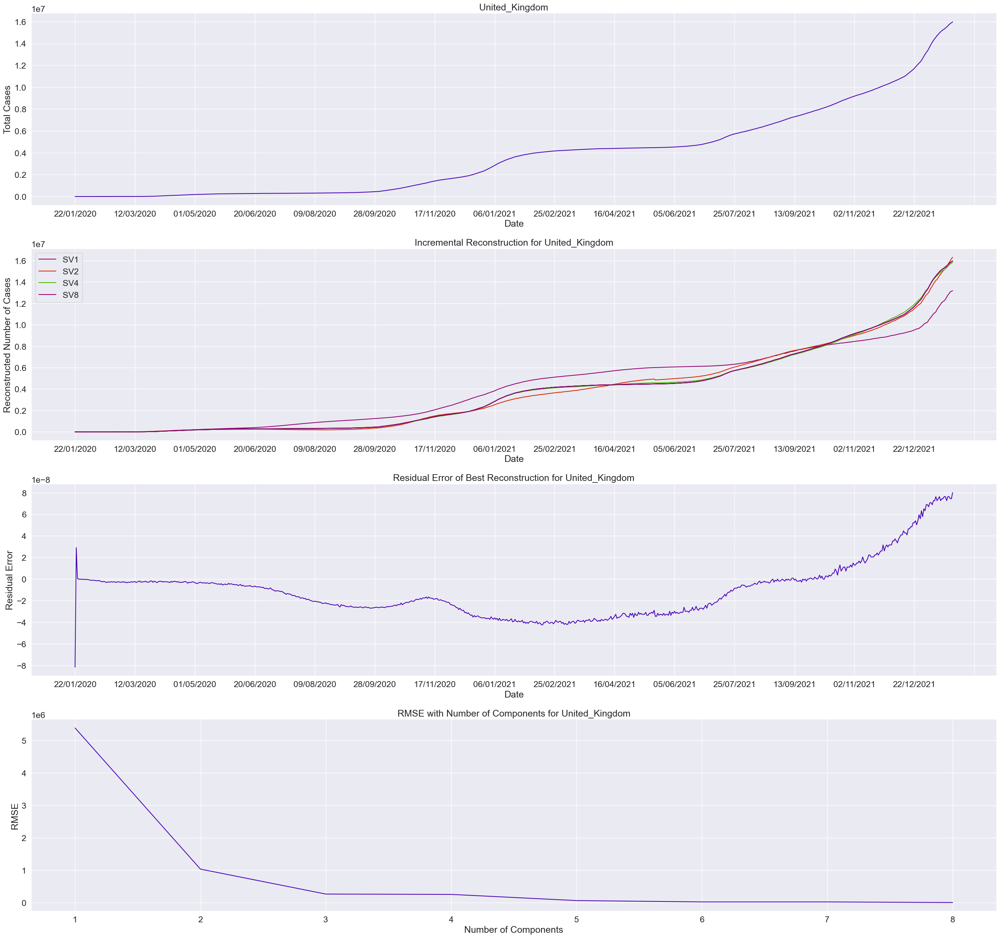

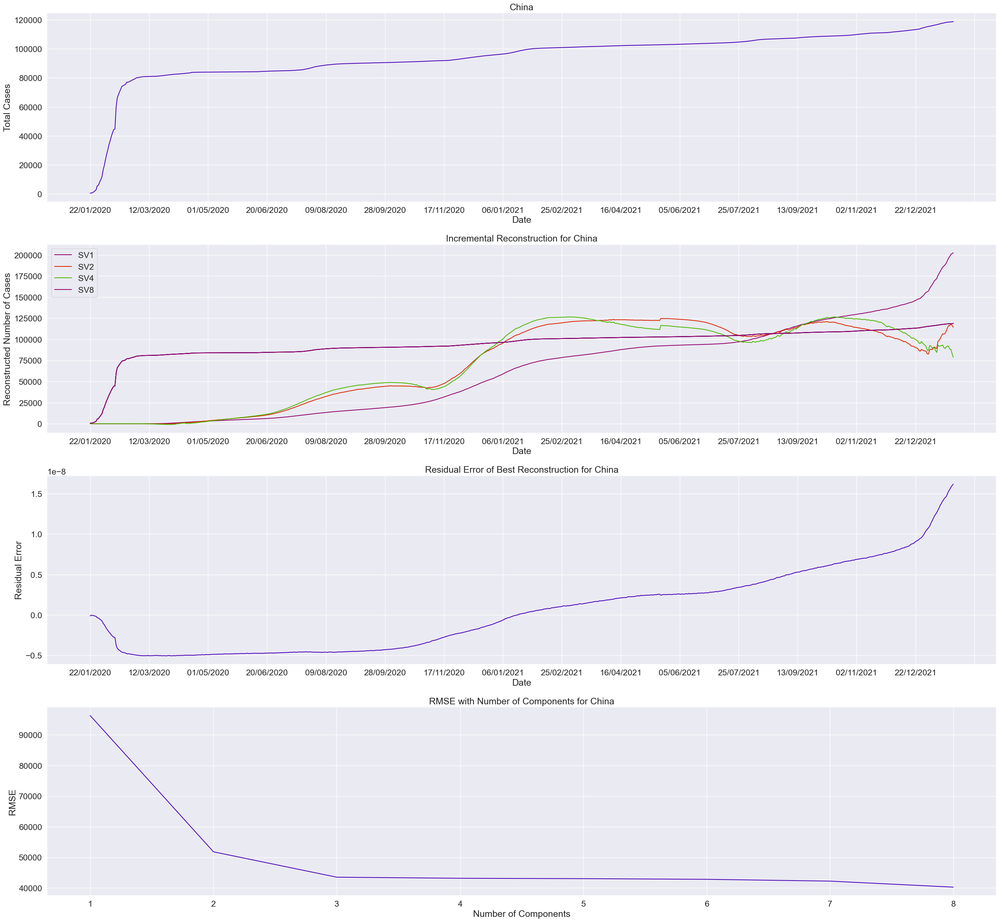

In [466]:
# Empty 3x10 numpy array 
RMSE_SVD = np.zeros((3,8))
RMSE_SVD[0] = plot_country_figures_SVD(key_countries, 'US')
RMSE_SVD[1] = plot_country_figures_SVD(key_countries, 'United_Kingdom')
RMSE_SVD[2] = plot_country_figures_SVD(key_countries, 'China')

In [471]:
def pca_vs_svd(pca, svd, country_list):
    
    for i in range(0,3):
        plt.figure(1, figsize = (28,8), dpi = 100)
        plt.plot(range(1,9), pca[i], label = 'PCA')
        plt.plot(range(1,9), svd[i], label = 'SVD')
        plt.title(f'RMSE of the PCA and SVD for {country_list[i]}')
        plt.xlabel("Components Used")
        plt.ylabel("RMSE")
        plt.legend()
        plt.show()

    diff = []
    for i in range(0,3):
        diff.append(pca[i] - svd[i])
        plt.figure(2, figsize = (28,8), dpi = 100)
        plt.plot(range(1,9), diff[i], label = country_list[i])
        plt.title(f'Difference in the RMSE for {country_list[i]}')
        plt.xlabel("Components Used")
        plt.ylabel("RMSE")
        plt.show()

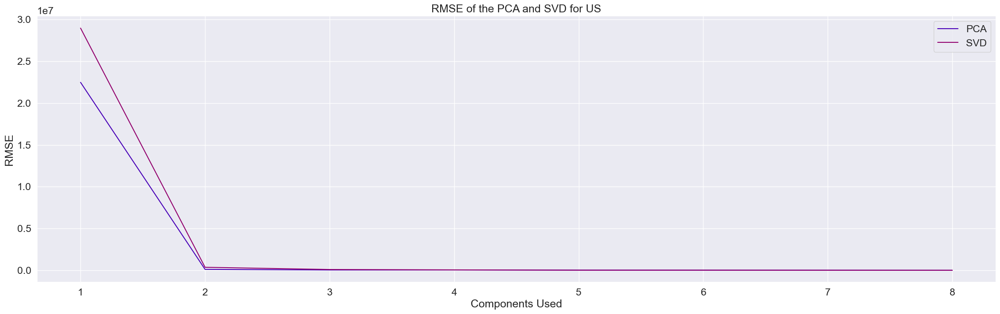

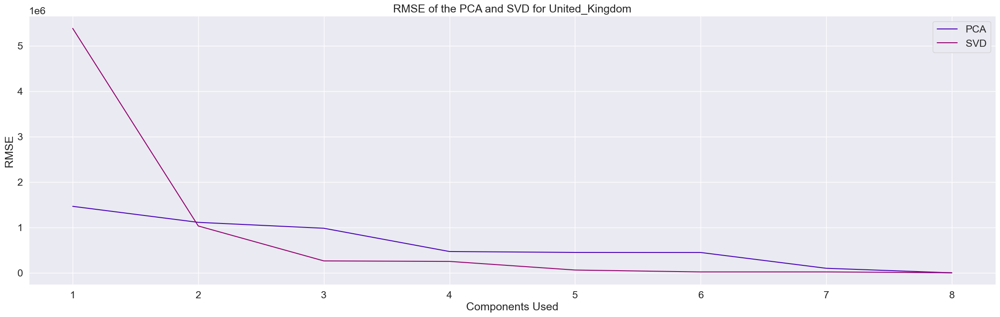

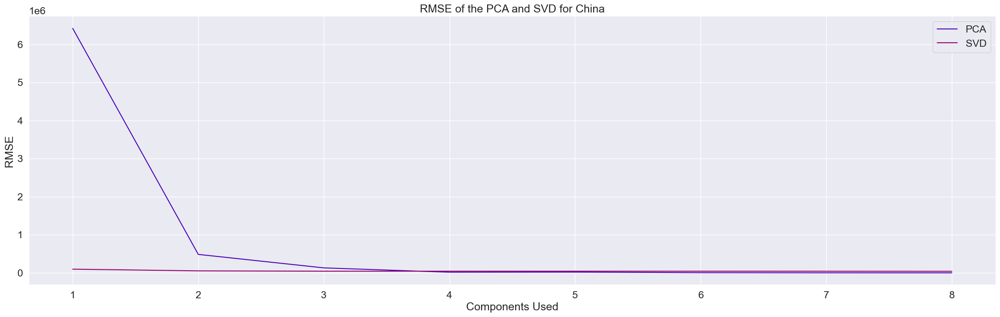

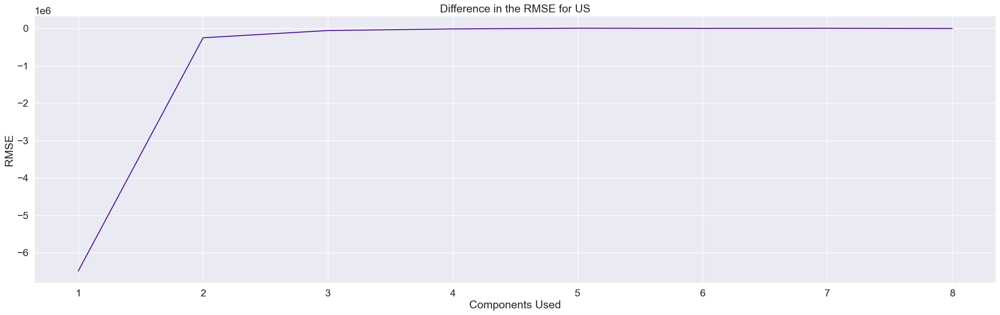

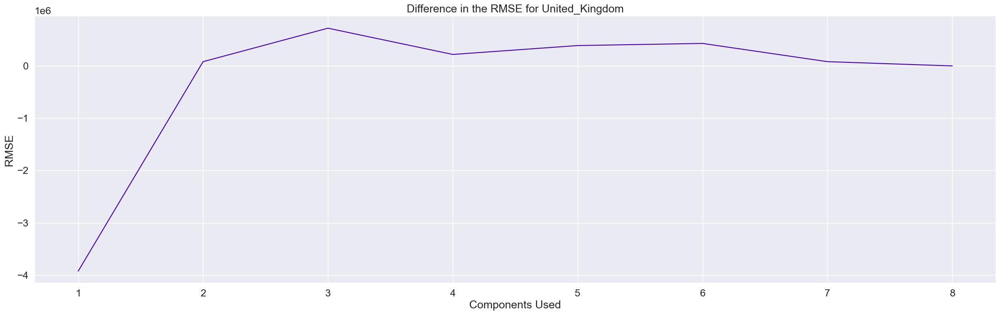

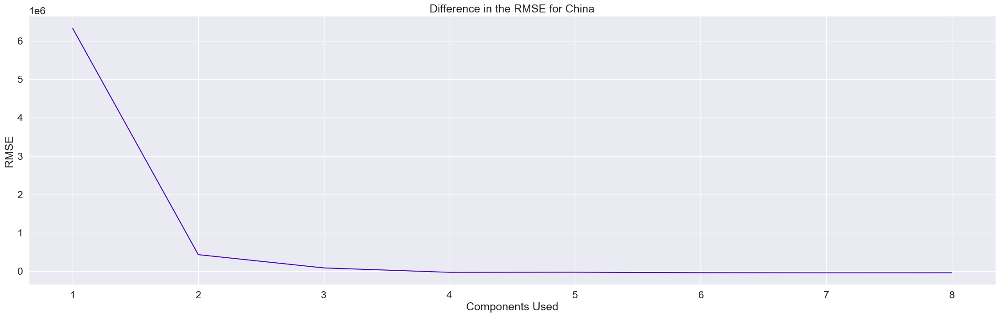

In [472]:
pca_vs_svd(RMSE_PCA, RMSE_SVD, ['US', 'United_Kingdom', 'China'])

# References

Understanding PCA and SVD:

1. https://towardsdatascience.com/pca-and-svd-explained-with-numpy-5d13b0d2a4d8

2. https://stats.stackexchange.com/questions/134282/relationship-between-svd-and-pca-how-to-use-svd-to-perform-pca

3. https://stats.stackexchange.com/questions/2691/making-sense-of-principal-component-analysis-eigenvectors-eigenvalues

4. https://hadrienj.github.io/posts/Deep-Learning-Book-Series-2.8-Singular-Value-Decomposition/

PCA:

1. Snippets from: https://plot.ly/ipython-notebooks/principal-component-analysis/

2. https://www.value-at-risk.net/principal-component-analysis/

Covid Data:

1. https://www.worldometers.info/coronavirus/

2. https://datahub.io/core/covid-19#resource-time-series-19-covid-combined

